# Brightfield stack projector

![](http://reconstrue.com/projects/brightfield_neurons/demo_images/713686035.minip_colored_turbo.tif.cropped.png)


## Introduction

This notebook performs one task: project a 3D image stack down to a 2D. Two flavors of projection are produced:
1. Minimum intensity projection
2. Depth coded projection

The former is grayscale, the latter is a color image.

In the context of brightfield microscopy, the standard projection is  the Minimum Intensity Projection (herein, MinIP). A MinIP can be thought of as the grayscale cover image of a brightfield image stack.

A less well known projection is "depth coding" where one axis (Z) is collapsed – as in the MinIP case, selecting the minimum value in each Z-column of voxels – but additionally stack depth is coded in color. ImageJ calls this ["depth encoding"](https://imagej.net/Z-functions#Depth_Coding):
>One method of preserving some z-information in a 2D image is to 'depth-encode' the stack. A monochrome 3D image can be colored so that the color represents the z-depth.

## Setup

This is a Jupyter notebook which has been designed to work on Colab, ergo any packages not preinstalled on Colab need to be explicitly pip/conda'd within the notebook. Colab is the deploy target development focused on, but this also works in JupyterLab.

### Imports

In [0]:
import boto3
import datetime
import glob
import google
import ipywidgets
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import plotly
import time
import requests
import seaborn as sns
import skimage
import sys
import urllib
import IPython
import PIL

from IPython.display import HTML, display
from PIL import Image
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import minmax_scale

# TODO: just import google.colab; kill off other from google.colab's: 
# from google.colab import output
from google.colab import widgets
from google.colab import files
import plotly.graph_objects as go # TODO: lame alias in import, confusing


### Utility code

Various utilities need to be defined as a prelude to the main work.

#### Colormapping

http://reconstrue.com/visualization/colormapping.html

Various color maps have been exercised to see if they look good with biocytin-stained neurons imaged via brightfield. The short list, best first is as follows:
- turbo: A better Jet (Google AI 2019)
- cubehelix: cold blue
- viridis: green and yellow
- inferno: redish
- inverted: grayscale but inverted


In [0]:
use_color_map = "turbo" #@param ["gray", "inverted", "turbo", "cubehelix", "viridis", "colorcet", "cividis", "magma", "plasma", "inferno"]

# See https://gist.github.com/mikhailov-work/ee72ba4191942acecc03fe6da94fc73f
turbo_colormap_data = [[0.18995,0.07176,0.23217],[0.19483,0.08339,0.26149],[0.19956,0.09498,0.29024],[0.20415,0.10652,0.31844],[0.20860,0.11802,0.34607],[0.21291,0.12947,0.37314],[0.21708,0.14087,0.39964],[0.22111,0.15223,0.42558],[0.22500,0.16354,0.45096],[0.22875,0.17481,0.47578],[0.23236,0.18603,0.50004],[0.23582,0.19720,0.52373],[0.23915,0.20833,0.54686],[0.24234,0.21941,0.56942],[0.24539,0.23044,0.59142],[0.24830,0.24143,0.61286],[0.25107,0.25237,0.63374],[0.25369,0.26327,0.65406],[0.25618,0.27412,0.67381],[0.25853,0.28492,0.69300],[0.26074,0.29568,0.71162],[0.26280,0.30639,0.72968],[0.26473,0.31706,0.74718],[0.26652,0.32768,0.76412],[0.26816,0.33825,0.78050],[0.26967,0.34878,0.79631],[0.27103,0.35926,0.81156],[0.27226,0.36970,0.82624],[0.27334,0.38008,0.84037],[0.27429,0.39043,0.85393],[0.27509,0.40072,0.86692],[0.27576,0.41097,0.87936],[0.27628,0.42118,0.89123],[0.27667,0.43134,0.90254],[0.27691,0.44145,0.91328],[0.27701,0.45152,0.92347],[0.27698,0.46153,0.93309],[0.27680,0.47151,0.94214],[0.27648,0.48144,0.95064],[0.27603,0.49132,0.95857],[0.27543,0.50115,0.96594],[0.27469,0.51094,0.97275],[0.27381,0.52069,0.97899],[0.27273,0.53040,0.98461],[0.27106,0.54015,0.98930],[0.26878,0.54995,0.99303],[0.26592,0.55979,0.99583],[0.26252,0.56967,0.99773],[0.25862,0.57958,0.99876],[0.25425,0.58950,0.99896],[0.24946,0.59943,0.99835],[0.24427,0.60937,0.99697],[0.23874,0.61931,0.99485],[0.23288,0.62923,0.99202],[0.22676,0.63913,0.98851],[0.22039,0.64901,0.98436],[0.21382,0.65886,0.97959],[0.20708,0.66866,0.97423],[0.20021,0.67842,0.96833],[0.19326,0.68812,0.96190],[0.18625,0.69775,0.95498],[0.17923,0.70732,0.94761],[0.17223,0.71680,0.93981],[0.16529,0.72620,0.93161],[0.15844,0.73551,0.92305],[0.15173,0.74472,0.91416],[0.14519,0.75381,0.90496],[0.13886,0.76279,0.89550],[0.13278,0.77165,0.88580],[0.12698,0.78037,0.87590],[0.12151,0.78896,0.86581],[0.11639,0.79740,0.85559],[0.11167,0.80569,0.84525],[0.10738,0.81381,0.83484],[0.10357,0.82177,0.82437],[0.10026,0.82955,0.81389],[0.09750,0.83714,0.80342],[0.09532,0.84455,0.79299],[0.09377,0.85175,0.78264],[0.09287,0.85875,0.77240],[0.09267,0.86554,0.76230],[0.09320,0.87211,0.75237],[0.09451,0.87844,0.74265],[0.09662,0.88454,0.73316],[0.09958,0.89040,0.72393],[0.10342,0.89600,0.71500],[0.10815,0.90142,0.70599],[0.11374,0.90673,0.69651],[0.12014,0.91193,0.68660],[0.12733,0.91701,0.67627],[0.13526,0.92197,0.66556],[0.14391,0.92680,0.65448],[0.15323,0.93151,0.64308],[0.16319,0.93609,0.63137],[0.17377,0.94053,0.61938],[0.18491,0.94484,0.60713],[0.19659,0.94901,0.59466],[0.20877,0.95304,0.58199],[0.22142,0.95692,0.56914],[0.23449,0.96065,0.55614],[0.24797,0.96423,0.54303],[0.26180,0.96765,0.52981],[0.27597,0.97092,0.51653],[0.29042,0.97403,0.50321],[0.30513,0.97697,0.48987],[0.32006,0.97974,0.47654],[0.33517,0.98234,0.46325],[0.35043,0.98477,0.45002],[0.36581,0.98702,0.43688],[0.38127,0.98909,0.42386],[0.39678,0.99098,0.41098],[0.41229,0.99268,0.39826],[0.42778,0.99419,0.38575],[0.44321,0.99551,0.37345],[0.45854,0.99663,0.36140],[0.47375,0.99755,0.34963],[0.48879,0.99828,0.33816],[0.50362,0.99879,0.32701],[0.51822,0.99910,0.31622],[0.53255,0.99919,0.30581],[0.54658,0.99907,0.29581],[0.56026,0.99873,0.28623],[0.57357,0.99817,0.27712],[0.58646,0.99739,0.26849],[0.59891,0.99638,0.26038],[0.61088,0.99514,0.25280],[0.62233,0.99366,0.24579],[0.63323,0.99195,0.23937],[0.64362,0.98999,0.23356],[0.65394,0.98775,0.22835],[0.66428,0.98524,0.22370],[0.67462,0.98246,0.21960],[0.68494,0.97941,0.21602],[0.69525,0.97610,0.21294],[0.70553,0.97255,0.21032],[0.71577,0.96875,0.20815],[0.72596,0.96470,0.20640],[0.73610,0.96043,0.20504],[0.74617,0.95593,0.20406],[0.75617,0.95121,0.20343],[0.76608,0.94627,0.20311],[0.77591,0.94113,0.20310],[0.78563,0.93579,0.20336],[0.79524,0.93025,0.20386],[0.80473,0.92452,0.20459],[0.81410,0.91861,0.20552],[0.82333,0.91253,0.20663],[0.83241,0.90627,0.20788],[0.84133,0.89986,0.20926],[0.85010,0.89328,0.21074],[0.85868,0.88655,0.21230],[0.86709,0.87968,0.21391],[0.87530,0.87267,0.21555],[0.88331,0.86553,0.21719],[0.89112,0.85826,0.21880],[0.89870,0.85087,0.22038],[0.90605,0.84337,0.22188],[0.91317,0.83576,0.22328],[0.92004,0.82806,0.22456],[0.92666,0.82025,0.22570],[0.93301,0.81236,0.22667],[0.93909,0.80439,0.22744],[0.94489,0.79634,0.22800],[0.95039,0.78823,0.22831],[0.95560,0.78005,0.22836],[0.96049,0.77181,0.22811],[0.96507,0.76352,0.22754],[0.96931,0.75519,0.22663],[0.97323,0.74682,0.22536],[0.97679,0.73842,0.22369],[0.98000,0.73000,0.22161],[0.98289,0.72140,0.21918],[0.98549,0.71250,0.21650],[0.98781,0.70330,0.21358],[0.98986,0.69382,0.21043],[0.99163,0.68408,0.20706],[0.99314,0.67408,0.20348],[0.99438,0.66386,0.19971],[0.99535,0.65341,0.19577],[0.99607,0.64277,0.19165],[0.99654,0.63193,0.18738],[0.99675,0.62093,0.18297],[0.99672,0.60977,0.17842],[0.99644,0.59846,0.17376],[0.99593,0.58703,0.16899],[0.99517,0.57549,0.16412],[0.99419,0.56386,0.15918],[0.99297,0.55214,0.15417],[0.99153,0.54036,0.14910],[0.98987,0.52854,0.14398],[0.98799,0.51667,0.13883],[0.98590,0.50479,0.13367],[0.98360,0.49291,0.12849],[0.98108,0.48104,0.12332],[0.97837,0.46920,0.11817],[0.97545,0.45740,0.11305],[0.97234,0.44565,0.10797],[0.96904,0.43399,0.10294],[0.96555,0.42241,0.09798],[0.96187,0.41093,0.09310],[0.95801,0.39958,0.08831],[0.95398,0.38836,0.08362],[0.94977,0.37729,0.07905],[0.94538,0.36638,0.07461],[0.94084,0.35566,0.07031],[0.93612,0.34513,0.06616],[0.93125,0.33482,0.06218],[0.92623,0.32473,0.05837],[0.92105,0.31489,0.05475],[0.91572,0.30530,0.05134],[0.91024,0.29599,0.04814],[0.90463,0.28696,0.04516],[0.89888,0.27824,0.04243],[0.89298,0.26981,0.03993],[0.88691,0.26152,0.03753],[0.88066,0.25334,0.03521],[0.87422,0.24526,0.03297],[0.86760,0.23730,0.03082],[0.86079,0.22945,0.02875],[0.85380,0.22170,0.02677],[0.84662,0.21407,0.02487],[0.83926,0.20654,0.02305],[0.83172,0.19912,0.02131],[0.82399,0.19182,0.01966],[0.81608,0.18462,0.01809],[0.80799,0.17753,0.01660],[0.79971,0.17055,0.01520],[0.79125,0.16368,0.01387],[0.78260,0.15693,0.01264],[0.77377,0.15028,0.01148],[0.76476,0.14374,0.01041],[0.75556,0.13731,0.00942],[0.74617,0.13098,0.00851],[0.73661,0.12477,0.00769],[0.72686,0.11867,0.00695],[0.71692,0.11268,0.00629],[0.70680,0.10680,0.00571],[0.69650,0.10102,0.00522],[0.68602,0.09536,0.00481],[0.67535,0.08980,0.00449],[0.66449,0.08436,0.00424],[0.65345,0.07902,0.00408],[0.64223,0.07380,0.00401],[0.63082,0.06868,0.00401],[0.61923,0.06367,0.00410],[0.60746,0.05878,0.00427],[0.59550,0.05399,0.00453],[0.58336,0.04931,0.00486],[0.57103,0.04474,0.00529],[0.55852,0.04028,0.00579],[0.54583,0.03593,0.00638],[0.53295,0.03169,0.00705],[0.51989,0.02756,0.00780],[0.50664,0.02354,0.00863],[0.49321,0.01963,0.00955],[0.47960,0.01583,0.01055]]
turbo_cmap=ListedColormap(turbo_colormap_data)

colormaps = {
  "turbo": turbo_cmap,
  "inverted": plt.cm.gray_r,
  "cubehelix": plt.cm.cubehelix,
  "inferno": "inferno",
  "viridis": "viridis"
}
colormap_current = colormaps.get(use_color_map)



#### Image viewer

In [0]:
def display_image(image_to_show, scale_factor): 
  # TODO: want to set viewport dimensions to output cell, not image_to_show 

  # Create figure
  fig = go.Figure()
    
  # Constants
  h, w = image_to_show.size
  img_width = h
  img_height = w

  #scale_factor = 0.15 
  # TODO: want scale_factor sensitive to cell/window width, else controls off screen to right.
  # There is also Colab API for checking and requesting output size. What about when in full screen; there is resize logic already

  # Add invisible scatter trace.
  # This trace is added to help the autoresize logic work.
  fig.add_trace(
    go.Scatter(
    x=[0, img_width * scale_factor],
    y=[0, img_height * scale_factor],
    mode="markers",
    marker_opacity=0
   )
  )
    
  # Configure axes
  fig.update_xaxes(
    visible=True,
    showgrid=False,
    range=[0, img_width] #range=[0, img_width * scale_factor]
  )
    
  fig.update_yaxes(
    visible=True,
    showgrid=False,
    range=[0, img_height],#range=[0, img_height * scale_factor],
    # the scaleanchor attribute ensures that the aspect ratio stays constant
    scaleanchor="x"
  )
    
  # Add image
  fig.update_layout(
    images=[go.layout.Image(
      x=0,
      sizex=img_width, # * scale_factor,
      y=img_height, # * scale_factor,
      sizey=img_height, # * scale_factor,
      xref="x",
      yref="y",
      opacity=1.0,
      layer="below",
      sizing="stretch",
      source=image_to_show)] #input_image)] # "https://raw.githubusercontent.com/michaelbabyn/plot_data/master/bridge.jpg")]
  )
    
  # Configure other layout
  fig.update_layout(
    width=img_width * scale_factor,
    height=img_height * scale_factor,
    margin={"l": 0, "r": 0, "t": 0, "b": 0},
  )
    

  fig.show()

## Get a MinIP

The goal is generate and then colorize Minimum Intensity Projections. Sometimes they are called MIP but I prefer MinIP to distinguish from MaxIP. In brightfield data, projection algorithms collect minimum intensities, not maximum intensities.

For simplicity, let's assume the code is given a pre-generated MinIP image file. That means the input is one single image TIFF file, monochrome 8-bit pixels. (Later we'll add in code to take a raw stack and turn it into a MinIP; TODO: that should really be a call into a package.)

### Upload a file

In [0]:
import google.colab
import os

# This is how to manually upload, which is a hassle while in the developing loop, so disabled. 
# Downloading from an URL is faster/easier.
do_manual_uploading = False
if do_manual_uploading:
  uploads = google.colab.files.upload()
  for fn in uploads.keys():
    print('File "{name}" with length {length} bytes uploaded'.format(name=fn, length=len(uploads[fn])))

  if len(uploads.keys()) == 1:
    minip_filename = os.path.join(os.getcwd(), list(uploads.keys())[0])
  else:
    raise Exception("yikes")
  print('minip_filename= %s' % minip_filename)
  !echo -----------
  !pwd
  !echo -----------
  !ls -lh

### A pre-generated MinIP

713686035.minip_original.tif



In [0]:
!wget --output-document=minip.tif http://reconstrue.com/projects/brightfield_neurons/demo_images/713686035.minip_original.tif

--2020-01-31 10:21:02--  http://reconstrue.com/projects/brightfield_neurons/demo_images/713686035.minip_original.tif
Resolving reconstrue.com (reconstrue.com)... 69.163.153.28
Connecting to reconstrue.com (reconstrue.com)|69.163.153.28|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 32913358 (31M) [image/tiff]
Saving to: ‘minip.tif’

minip.tif           100%[===================>]  31.39M  89.3MB/s    in 0.4s    

2020-01-31 10:21:02 (89.3 MB/s) - ‘minip.tif’ saved [32913358/32913358]



In [0]:
!ls -lh

total 63M
-rw-r--r-- 1 root root  32M Jan 31 00:11  713686035.minip_original.tif
-rw-r--r-- 1 root root  32M Jan 31 00:11  minip.tif
drwxr-xr-x 1 root root 4.0K Jan 13 16:38  sample_data
-rw-r--r-- 1 root root  30K Jan 31 03:29 'shutu_stitched (1).jpg'
-rw-r--r-- 1 root root  30K Jan 31 03:29 'shutu_stitched (2).jpg'
-rw-r--r-- 1 root root  30K Jan 31 03:28  shutu_stitched.jpg


In [0]:
minip_filename = os.path.join(os.getcwd(), 'minip.tif')
print(minip_filename)

/content/minip.tif


## Matplotlib

If plotting in Python, the normal first stop is Matplotlib. 


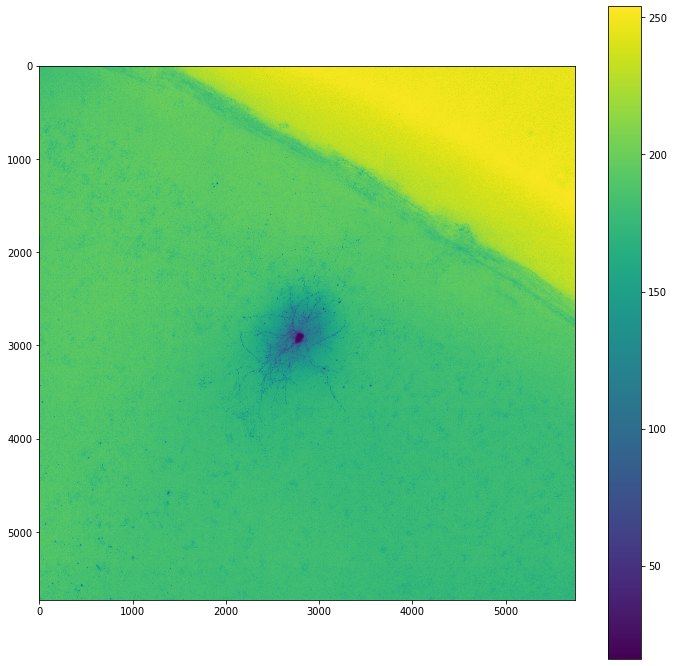

In [0]:
#print(image_to_show)
# plt.hist(image_to_show.ravel(), bins=256, range=(0.0, 1.0), fc='k', ec='k')

import matplotlib.image as mpimg

mplimg = mpimg.imread(minip_filename)

#print(mplimg)

plt.figure(figsize = (12,12))
plt.imshow(mplimg)
plt.colorbar()

Notice how the default colormap is Viridis, as per [the MPL docs](https://matplotlib.org/tutorials/introductory/images.html). The way to specify a colormap is to pass in a `cmap` parameter.

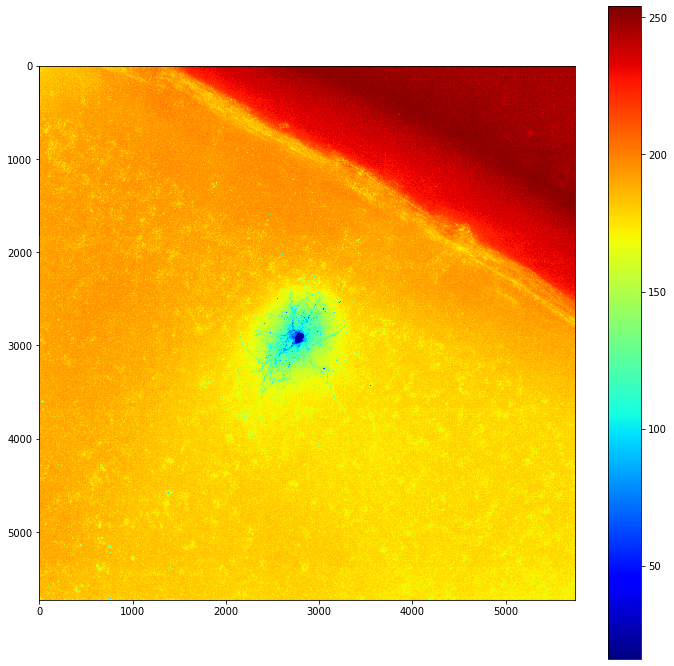

In [0]:
plt.figure(figsize = (12,12))
minip_view = plt.imshow(mplimg, cmap=colormap_current)
minip_view.set_cmap('jet')
plt.colorbar()


### Load MinIP file

On the other hand, feeding a PIL to plotly.graph_objects seems to default to gray.


In [0]:
# TODO: https://github.com/reconstrue/brightfield_neuron_reconstruction/issues/58
# full 22M causes a disconnect/crash so downsize
image_to_show = PIL.Image.open(minip_filename)
minip_original = image_to_show


Notice that on 2020-01-30, this downloaded a 32 MB MinIP (well, one quarter so 8 MB). Two months earlier, things were crapping out around 20 MB.


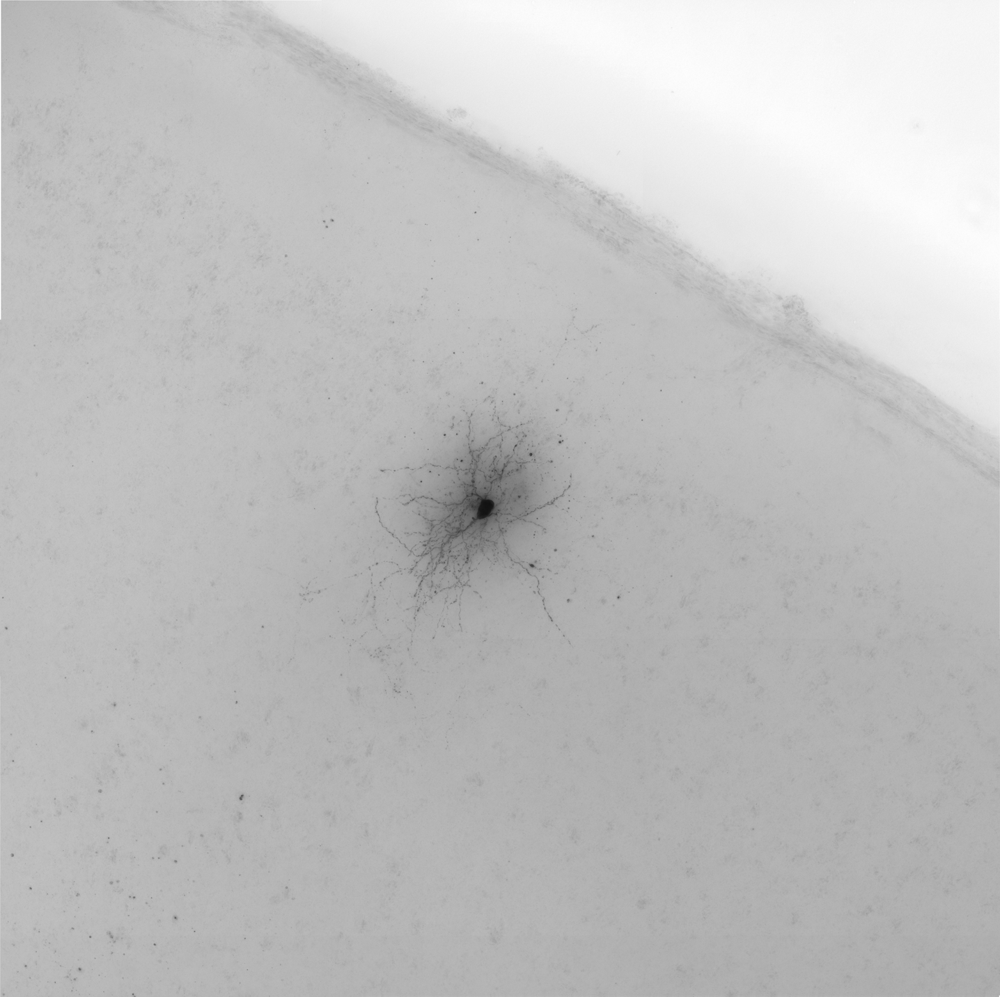

In [0]:
scale_factor = 0.49 #@param {type:"slider", min:0.05, max:1, step:0.01}

# TODO: what's this colormap_mapping?
# This cell just loads pre-colored minIP from FS, so no form input used
view_color_map = "viridis" #@param ["gray", "inverted", "turbo", "cubehelix", "viridis", "colorcet", "cividis", "magma", "plasma", "inferno"]
view_colormap = colormaps.get(view_color_map)


# open file, treat it as an array, convolve a colormap through it, return to PIL Image
#But first need to normalize image?
#numpy.asarray(image_to_show)


width, height = image_to_show.size
#print(width, height)
image_to_show = image_to_show.resize((int(width/2), int(height/2)), Image.ANTIALIAS)

display_image(image_to_show, scale_factor)

## Stats

MPL docs [[*](https://matplotlib.org/tutorials/introductory/images.html)]:
>Sometimes you want to enhance the contrast in your image, or expand the contrast in a particular region while sacrificing the detail in colors that don't vary much, or don't matter. A good tool to find interesting regions is the histogram. To create a histogram of our image data, we use the hist() function.

```python
plt.hist(lum_img.ravel(), bins=256, range=(0.0, 1.0), fc='k', ec='k')
```

## ROI focus

Only a part of the entire slide is interesting. Let's subset to that b/c less low value training work.



256
768
768



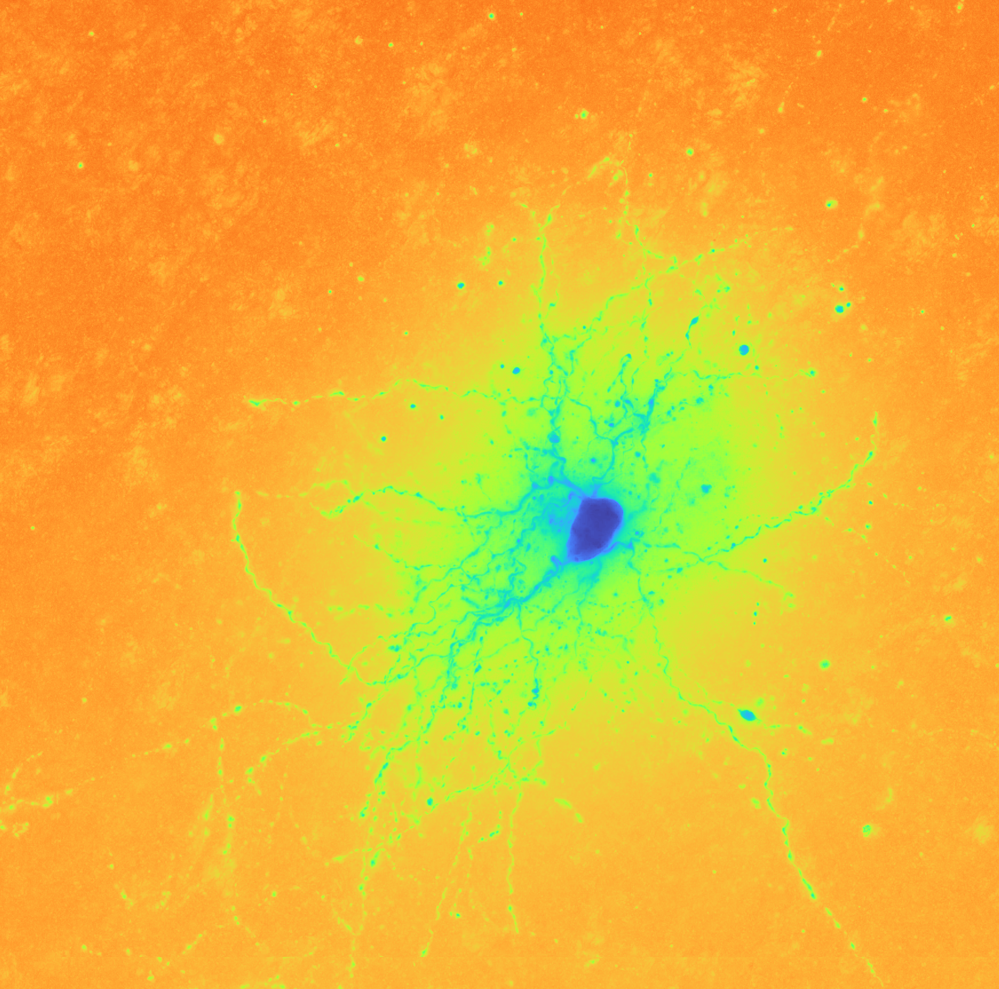

In [0]:
import skimage.io

# How much to crop from each side: ((top, bottom), (left, right))
crop_box_for_713686035 = ((2000,2000),(1750,2250))

projection_orig = skimage.io.imread(minip_filename)

minip_cropped = skimage.util.crop(projection_orig, crop_box_for_713686035)

#print(minip_cropped)

minip_cropped_pil = PIL.Image.fromarray(minip_cropped)

lut = []
for i in range(256):
    lut.extend([int(255-i), int(i/2), int(i)])
#minip_cropped_pil.putpalette(lut)


turbo_colormap_data = [[0.18995,0.07176,0.23217],[0.19483,0.08339,0.26149],[0.19956,0.09498,0.29024],[0.20415,0.10652,0.31844],[0.20860,0.11802,0.34607],[0.21291,0.12947,0.37314],[0.21708,0.14087,0.39964],[0.22111,0.15223,0.42558],[0.22500,0.16354,0.45096],[0.22875,0.17481,0.47578],[0.23236,0.18603,0.50004],[0.23582,0.19720,0.52373],[0.23915,0.20833,0.54686],[0.24234,0.21941,0.56942],[0.24539,0.23044,0.59142],[0.24830,0.24143,0.61286],[0.25107,0.25237,0.63374],[0.25369,0.26327,0.65406],[0.25618,0.27412,0.67381],[0.25853,0.28492,0.69300],[0.26074,0.29568,0.71162],[0.26280,0.30639,0.72968],[0.26473,0.31706,0.74718],[0.26652,0.32768,0.76412],[0.26816,0.33825,0.78050],[0.26967,0.34878,0.79631],[0.27103,0.35926,0.81156],[0.27226,0.36970,0.82624],[0.27334,0.38008,0.84037],[0.27429,0.39043,0.85393],[0.27509,0.40072,0.86692],[0.27576,0.41097,0.87936],[0.27628,0.42118,0.89123],[0.27667,0.43134,0.90254],[0.27691,0.44145,0.91328],[0.27701,0.45152,0.92347],[0.27698,0.46153,0.93309],[0.27680,0.47151,0.94214],[0.27648,0.48144,0.95064],[0.27603,0.49132,0.95857],[0.27543,0.50115,0.96594],[0.27469,0.51094,0.97275],[0.27381,0.52069,0.97899],[0.27273,0.53040,0.98461],[0.27106,0.54015,0.98930],[0.26878,0.54995,0.99303],[0.26592,0.55979,0.99583],[0.26252,0.56967,0.99773],[0.25862,0.57958,0.99876],[0.25425,0.58950,0.99896],[0.24946,0.59943,0.99835],[0.24427,0.60937,0.99697],[0.23874,0.61931,0.99485],[0.23288,0.62923,0.99202],[0.22676,0.63913,0.98851],[0.22039,0.64901,0.98436],[0.21382,0.65886,0.97959],[0.20708,0.66866,0.97423],[0.20021,0.67842,0.96833],[0.19326,0.68812,0.96190],[0.18625,0.69775,0.95498],[0.17923,0.70732,0.94761],[0.17223,0.71680,0.93981],[0.16529,0.72620,0.93161],[0.15844,0.73551,0.92305],[0.15173,0.74472,0.91416],[0.14519,0.75381,0.90496],[0.13886,0.76279,0.89550],[0.13278,0.77165,0.88580],[0.12698,0.78037,0.87590],[0.12151,0.78896,0.86581],[0.11639,0.79740,0.85559],[0.11167,0.80569,0.84525],[0.10738,0.81381,0.83484],[0.10357,0.82177,0.82437],[0.10026,0.82955,0.81389],[0.09750,0.83714,0.80342],[0.09532,0.84455,0.79299],[0.09377,0.85175,0.78264],[0.09287,0.85875,0.77240],[0.09267,0.86554,0.76230],[0.09320,0.87211,0.75237],[0.09451,0.87844,0.74265],[0.09662,0.88454,0.73316],[0.09958,0.89040,0.72393],[0.10342,0.89600,0.71500],[0.10815,0.90142,0.70599],[0.11374,0.90673,0.69651],[0.12014,0.91193,0.68660],[0.12733,0.91701,0.67627],[0.13526,0.92197,0.66556],[0.14391,0.92680,0.65448],[0.15323,0.93151,0.64308],[0.16319,0.93609,0.63137],[0.17377,0.94053,0.61938],[0.18491,0.94484,0.60713],[0.19659,0.94901,0.59466],[0.20877,0.95304,0.58199],[0.22142,0.95692,0.56914],[0.23449,0.96065,0.55614],[0.24797,0.96423,0.54303],[0.26180,0.96765,0.52981],[0.27597,0.97092,0.51653],[0.29042,0.97403,0.50321],[0.30513,0.97697,0.48987],[0.32006,0.97974,0.47654],[0.33517,0.98234,0.46325],[0.35043,0.98477,0.45002],[0.36581,0.98702,0.43688],[0.38127,0.98909,0.42386],[0.39678,0.99098,0.41098],[0.41229,0.99268,0.39826],[0.42778,0.99419,0.38575],[0.44321,0.99551,0.37345],[0.45854,0.99663,0.36140],[0.47375,0.99755,0.34963],[0.48879,0.99828,0.33816],[0.50362,0.99879,0.32701],[0.51822,0.99910,0.31622],[0.53255,0.99919,0.30581],[0.54658,0.99907,0.29581],[0.56026,0.99873,0.28623],[0.57357,0.99817,0.27712],[0.58646,0.99739,0.26849],[0.59891,0.99638,0.26038],[0.61088,0.99514,0.25280],[0.62233,0.99366,0.24579],[0.63323,0.99195,0.23937],[0.64362,0.98999,0.23356],[0.65394,0.98775,0.22835],[0.66428,0.98524,0.22370],[0.67462,0.98246,0.21960],[0.68494,0.97941,0.21602],[0.69525,0.97610,0.21294],[0.70553,0.97255,0.21032],[0.71577,0.96875,0.20815],[0.72596,0.96470,0.20640],[0.73610,0.96043,0.20504],[0.74617,0.95593,0.20406],[0.75617,0.95121,0.20343],[0.76608,0.94627,0.20311],[0.77591,0.94113,0.20310],[0.78563,0.93579,0.20336],[0.79524,0.93025,0.20386],[0.80473,0.92452,0.20459],[0.81410,0.91861,0.20552],[0.82333,0.91253,0.20663],[0.83241,0.90627,0.20788],[0.84133,0.89986,0.20926],[0.85010,0.89328,0.21074],[0.85868,0.88655,0.21230],[0.86709,0.87968,0.21391],[0.87530,0.87267,0.21555],[0.88331,0.86553,0.21719],[0.89112,0.85826,0.21880],[0.89870,0.85087,0.22038],[0.90605,0.84337,0.22188],[0.91317,0.83576,0.22328],[0.92004,0.82806,0.22456],[0.92666,0.82025,0.22570],[0.93301,0.81236,0.22667],[0.93909,0.80439,0.22744],[0.94489,0.79634,0.22800],[0.95039,0.78823,0.22831],[0.95560,0.78005,0.22836],[0.96049,0.77181,0.22811],[0.96507,0.76352,0.22754],[0.96931,0.75519,0.22663],[0.97323,0.74682,0.22536],[0.97679,0.73842,0.22369],[0.98000,0.73000,0.22161],[0.98289,0.72140,0.21918],[0.98549,0.71250,0.21650],[0.98781,0.70330,0.21358],[0.98986,0.69382,0.21043],[0.99163,0.68408,0.20706],[0.99314,0.67408,0.20348],[0.99438,0.66386,0.19971],[0.99535,0.65341,0.19577],[0.99607,0.64277,0.19165],[0.99654,0.63193,0.18738],[0.99675,0.62093,0.18297],[0.99672,0.60977,0.17842],[0.99644,0.59846,0.17376],[0.99593,0.58703,0.16899],[0.99517,0.57549,0.16412],[0.99419,0.56386,0.15918],[0.99297,0.55214,0.15417],[0.99153,0.54036,0.14910],[0.98987,0.52854,0.14398],[0.98799,0.51667,0.13883],[0.98590,0.50479,0.13367],[0.98360,0.49291,0.12849],[0.98108,0.48104,0.12332],[0.97837,0.46920,0.11817],[0.97545,0.45740,0.11305],[0.97234,0.44565,0.10797],[0.96904,0.43399,0.10294],[0.96555,0.42241,0.09798],[0.96187,0.41093,0.09310],[0.95801,0.39958,0.08831],[0.95398,0.38836,0.08362],[0.94977,0.37729,0.07905],[0.94538,0.36638,0.07461],[0.94084,0.35566,0.07031],[0.93612,0.34513,0.06616],[0.93125,0.33482,0.06218],[0.92623,0.32473,0.05837],[0.92105,0.31489,0.05475],[0.91572,0.30530,0.05134],[0.91024,0.29599,0.04814],[0.90463,0.28696,0.04516],[0.89888,0.27824,0.04243],[0.89298,0.26981,0.03993],[0.88691,0.26152,0.03753],[0.88066,0.25334,0.03521],[0.87422,0.24526,0.03297],[0.86760,0.23730,0.03082],[0.86079,0.22945,0.02875],[0.85380,0.22170,0.02677],[0.84662,0.21407,0.02487],[0.83926,0.20654,0.02305],[0.83172,0.19912,0.02131],[0.82399,0.19182,0.01966],[0.81608,0.18462,0.01809],[0.80799,0.17753,0.01660],[0.79971,0.17055,0.01520],[0.79125,0.16368,0.01387],[0.78260,0.15693,0.01264],[0.77377,0.15028,0.01148],[0.76476,0.14374,0.01041],[0.75556,0.13731,0.00942],[0.74617,0.13098,0.00851],[0.73661,0.12477,0.00769],[0.72686,0.11867,0.00695],[0.71692,0.11268,0.00629],[0.70680,0.10680,0.00571],[0.69650,0.10102,0.00522],[0.68602,0.09536,0.00481],[0.67535,0.08980,0.00449],[0.66449,0.08436,0.00424],[0.65345,0.07902,0.00408],[0.64223,0.07380,0.00401],[0.63082,0.06868,0.00401],[0.61923,0.06367,0.00410],[0.60746,0.05878,0.00427],[0.59550,0.05399,0.00453],[0.58336,0.04931,0.00486],[0.57103,0.04474,0.00529],[0.55852,0.04028,0.00579],[0.54583,0.03593,0.00638],[0.53295,0.03169,0.00705],[0.51989,0.02756,0.00780],[0.50664,0.02354,0.00863],[0.49321,0.01963,0.00955],[0.47960,0.01583,0.01055]]
turbo_256 = [ [np.int8(color[0]*256), np.int8(color[1]*256), np.int8(color[2]*256)] for color in turbo_colormap_data ]
print(len(turbo_256))
turbo_256_flat = np.array(turbo_256).flatten()
#print(turbo_256_flat)
print(len(turbo_256_flat))
print(len(lut))
#turbo_256 =  (turbo_colormap_data * [255, 255, 255]).round().astype(np.uint8)

#def color_f_to_246(aColor):
#  aColor = aColor * 256
#
#  return[
#map(

#npnp.array(turbo_colormap_data) * 256

# PIL pseudocolor: http://effbot.org/zone/pil-pseudocolor.htm
minip_cropped_pil.putpalette(turbo_256_flat)
#minip_cropped_pil.putpalette(lut)

display_image(minip_cropped_pil, scale_factor)

#display_image(PIL.Image.fromarray(scaled), scale_factor)

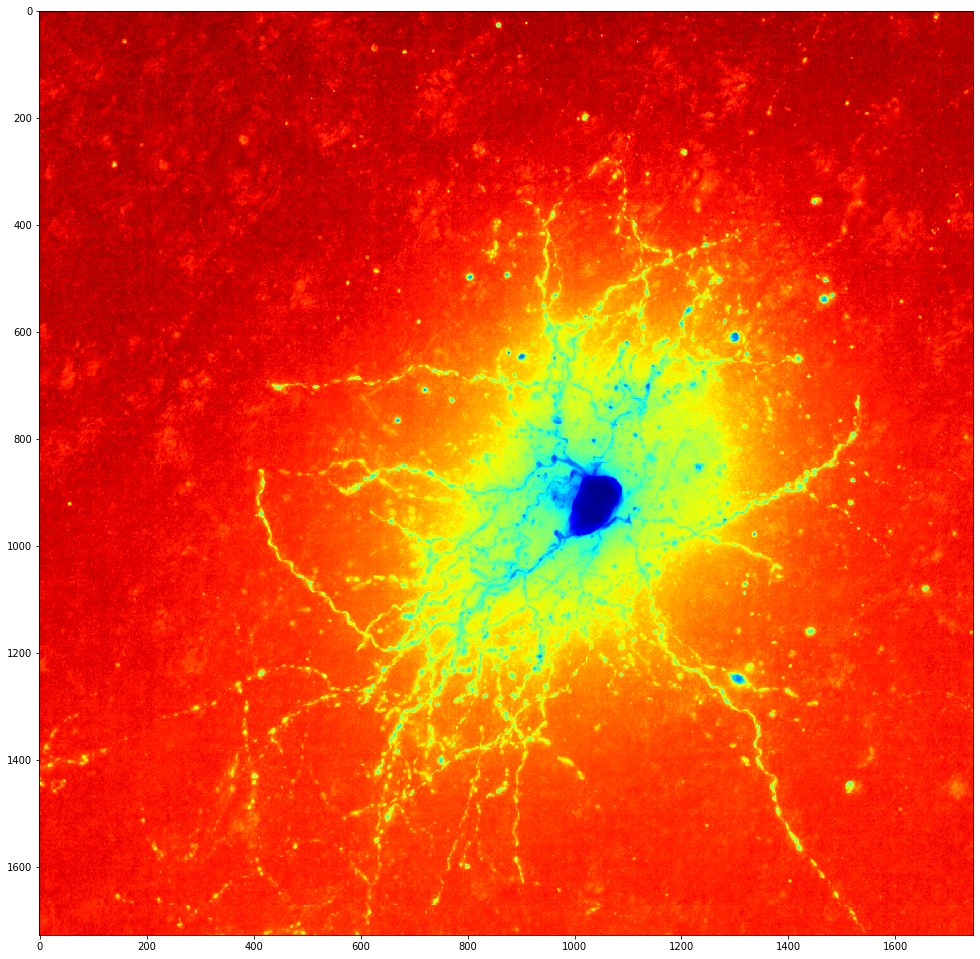

In [0]:
plt.figure(figsize = (17,17))
minip_view = plt.imshow(minip_cropped, cmap=colormap_current)
minip_view.set_cmap('jet')
#plt.colorbar()


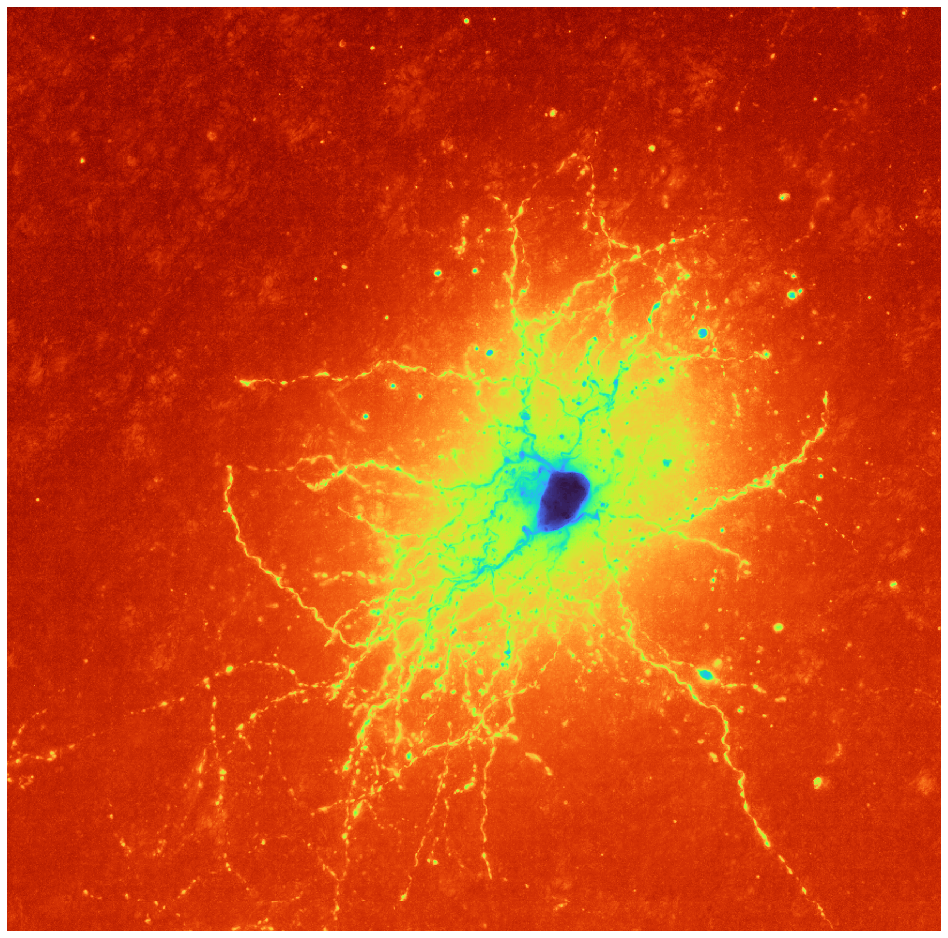

In [0]:
#  "inverted": plt.cm.gray_r,
#  "cubehelix": plt.cm.cubehelix,
#  "inferno": "inferno",
#  "viridis": "viridis"


fig = plt.figure(figsize = (17,17))
minip_view = plt.imshow(minip_cropped, cmap=turbo_cmap)
#minip_view.set_cmap('jet')
plt.axis('off')
print('')
#ax.get_xaxis().set_visible(False)
#ax.get_yaxis().set_visible(False)
#plt.colorbar()


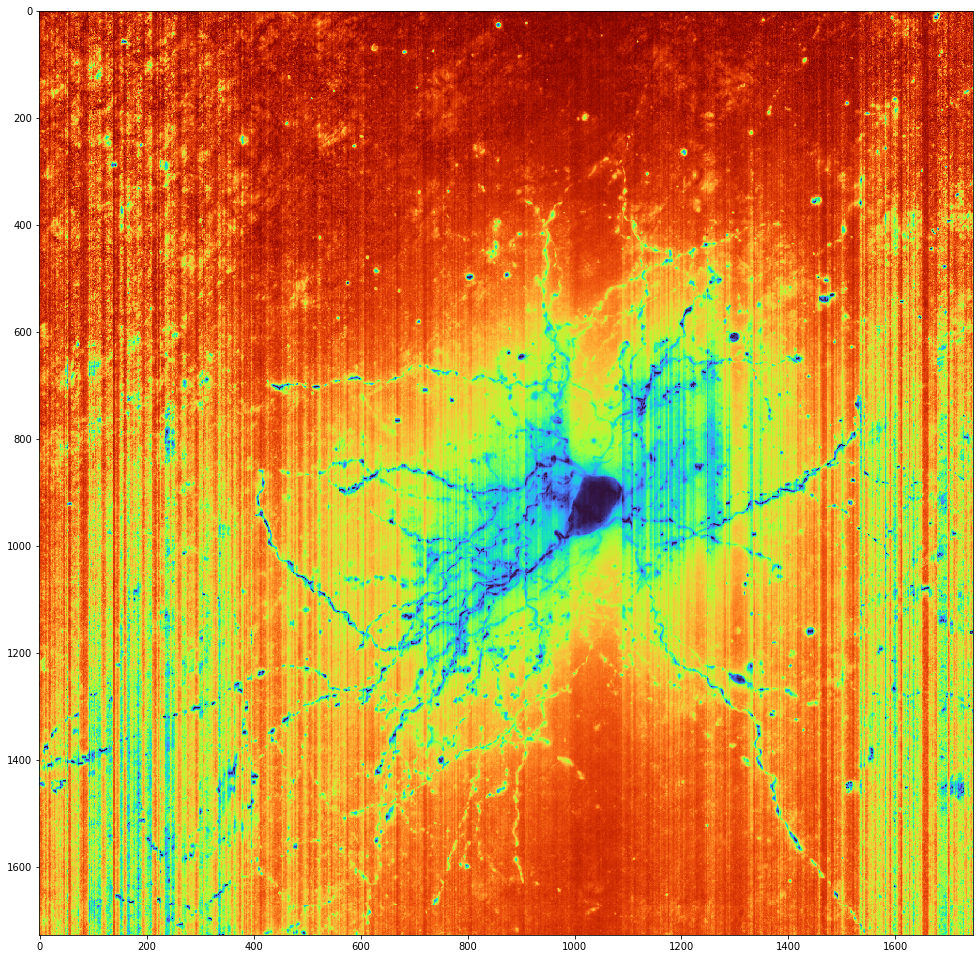

In [0]:
from sklearn.preprocessing import minmax_scale
scaled = minmax_scale(minip_cropped) * 255

plt.figure(figsize = (17,17))
minip_view = plt.imshow(scaled, cmap=colormap_current)
#minip_view.set_cmap('jet')
#xplt.colorbar()



In [0]:
lut = []
for i in range(256):
    lut.extend([255-i, i/2, i])
#im.putpalette(lut)
print(lut)
print(len(lut))

[255, 0.0, 0, 254, 0.5, 1, 253, 1.0, 2, 252, 1.5, 3, 251, 2.0, 4, 250, 2.5, 5, 249, 3.0, 6, 248, 3.5, 7, 247, 4.0, 8, 246, 4.5, 9, 245, 5.0, 10, 244, 5.5, 11, 243, 6.0, 12, 242, 6.5, 13, 241, 7.0, 14, 240, 7.5, 15, 239, 8.0, 16, 238, 8.5, 17, 237, 9.0, 18, 236, 9.5, 19, 235, 10.0, 20, 234, 10.5, 21, 233, 11.0, 22, 232, 11.5, 23, 231, 12.0, 24, 230, 12.5, 25, 229, 13.0, 26, 228, 13.5, 27, 227, 14.0, 28, 226, 14.5, 29, 225, 15.0, 30, 224, 15.5, 31, 223, 16.0, 32, 222, 16.5, 33, 221, 17.0, 34, 220, 17.5, 35, 219, 18.0, 36, 218, 18.5, 37, 217, 19.0, 38, 216, 19.5, 39, 215, 20.0, 40, 214, 20.5, 41, 213, 21.0, 42, 212, 21.5, 43, 211, 22.0, 44, 210, 22.5, 45, 209, 23.0, 46, 208, 23.5, 47, 207, 24.0, 48, 206, 24.5, 49, 205, 25.0, 50, 204, 25.5, 51, 203, 26.0, 52, 202, 26.5, 53, 201, 27.0, 54, 200, 27.5, 55, 199, 28.0, 56, 198, 28.5, 57, 197, 29.0, 58, 196, 29.5, 59, 195, 30.0, 60, 194, 30.5, 61, 193, 31.0, 62, 192, 31.5, 63, 191, 32.0, 64, 190, 32.5, 65, 189, 33.0, 66, 188, 33.5, 67, 187, 34.0

In [0]:
print(plt.cm.cubehelix)

plt.cm.cubehelix.

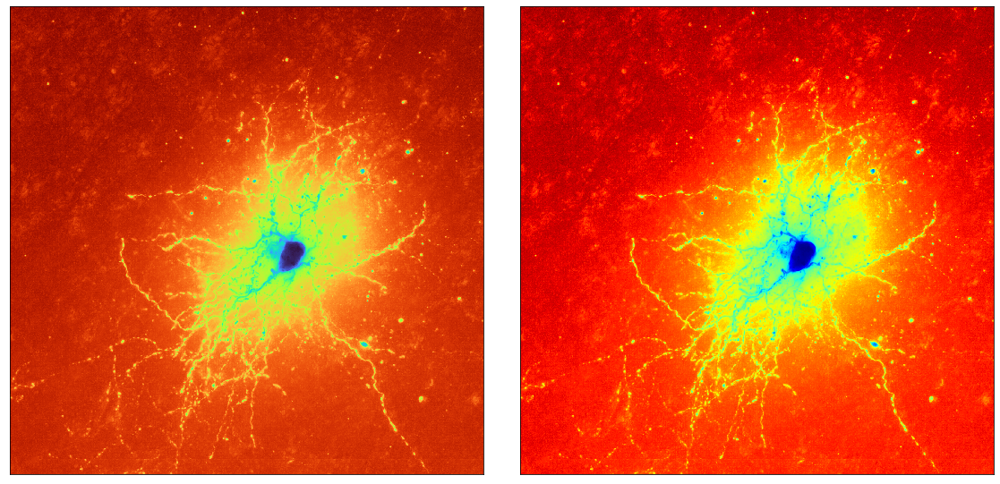

In [0]:
# Some example data to display
x = np.linspace(0, 2 * np.pi, 400)
y = np.sin(x ** 2)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8))
fig.tight_layout()
#fig.suptitle('Turbo vs Jet')
#ax1.plot(x, y)
ax1.imshow(minip_cropped, cmap=colormap_current)
ax2.imshow(minip_cropped, cmap=plt.cm.jet)

ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)

# fig, axes = plt.subplots(1, 2, figsize=(20,20), sharey=True, sharex=True)
# axes[0].set_aspect('equal', 'box')
# axes[1].set_aspect('equal', 'box') # 'box-forced'

plt.savefig("turbo_juxt_jet.png")


In [0]:
!ls

google.colab.files.download("turbo_juxt_jet.png")

minip.tif  sample_data	turbo_juxt_jet.png


### **TODO:** Lame raw MinIP view

This next technique is kinda crude. An image file in the tens of MB size range downloaded to the browser, then no zoom control. But it does have a nice feature of **allocating 100% screen to the image in full-screen mode.** (Note: if you have browser zoomed, it's even less elegant.)

**TODO:** So, display(PIL.Image) sizes nicely. Try more of that. Most image rendering so far has been through mpl; perhaps PIL is more elegant

In [0]:
# This bring down the full high-res 10s of MB image
print("Downloading to browser %s image file" % sizeof_fmt(os.path.getsize(minip_filename)))
print("Larger that 20MB will invite the system to crash with Disconnect error messages.")
# TODO: disabled sure, but really should be completely dropped in favor of more elegant solutions, 
# once that nice full screening is also done (somehow).
#display(PIL.Image.open(minip_filename))

# TODO:
# Also works from in-memory, rather than from file system: 
# display(PIL.Image.fromarray(projection))

## Colorized MinIP
The brightfield images are not color images, rather they are intensities from 0 to 255, in other words: grayscale images. Those 256 intensities can be color mapped. This code is Python so the stock Matplotlib color maps were explored for what seemed like brightfield friend candidates: those that seemed to bring out features in the brighfield images. Three colormaps from the stock matplotlib colormaps (Cubehelix, Inferno, Viridis) seem useful. Turbo is new an imported earlier in this notebook. 

Cubehelix is not listed at perceptually uniform but is sure looks it. Same goes for Turbo so... Also, the fact that the highest intensities go to white is very much like the nature of brightFIELD. Any others like that?

**TODO:** Add all preceptually uniform colormaps that are stock in mpl: https://matplotlib.org/3.1.1/tutorials/colors/colormaps.html


In [0]:
color_map = "turbo" #@param ["gray", "inverted", "turbo", "cubehelix", "viridis"]


curr_colormap = colormaps.get(color_map)

pix = np.array(skimage.io.imread(minip_filename))
colorized_minip_filename = os.path.join(build_output_dir, ("minip_colored_" + save_color_map + ".tif"))
plt.imsave(colorized_minip_filename, pix, cmap=curr_colormap, format="TIFF")
print("Wrote colorized MinIP to :\n" + colorized_minip_filename)


## Optionally download


In [0]:
from google.colab import files

with open('example.txt', 'w') as f:
  f.write('some content')

files.download('example.txt')

## Depth coding

2020-04-20: This is under development and is being tracked as [Issue #32](https://github.com/reconstrue/brightfield_on_colab/issues/32), which given the existing codebase is easy picking.

Depth coding is a 2D projection visualization of a 3D volume. In the brightfield modality, the data is "grayscale" i.e. each original voxel is single channel (the "intensity") rather than three channel color values. In the case of the Allen Institute's data, the intensity values are 8-bit i.e. they range from 0 to 255. Imaging neurons via biocytin staining means the stained neuron is opoque i.e. in-neuron voxels have intensities which are low, while the "field" is bright i.e. the intensities of the voxels have high values. Due to this, the valuable project is is the Minimal Intensity Projection (the MinIP) rather than, say, the Maximum Intensity Projection. Ergo, depth coding in brightfield means mapping the depth to a color along a rainbow while running the MinIP algorithm.


[ImageJ has a depth coding plug-in](https://imagej.net/Z-functions). The example micrography is not brightfield but it illustrates what depth coding looks like. The input would look like:

![](https://imagej.net/_images/5/5e/Z_coded_stack_original.png)

Z coding the depth looks like:

![](https://imagej.net/_images/e/eb/Z_coded_stack_colored.png)

Finally, the Maximum Intensity Projections of that looks like:

![](https://imagej.net/_images/4/46/Depth_code_max.png)

Note: this example is from a fluorescent modality wherein the maximum intensity is collected; brightfield collects the minimum intensities per Z column.




# Testing testing: markdown image alignment 

This section is just lorum ipsum to fill in during layout test of `img` and such on Colab.

Slurp burp a derp.

## Blah blah test title

<img src="http://reconstrue.com/projects/brightfield_neurons/demo_images/sidebar_1.png" width="200px" align="left" hspace="14px" vspace="7px" />

Bacon ipsum dolor amet cow tongue sirloin, chicken brisket pork belly pastrami boudin leberkas ham hock cupim pancetta ball tip kielbasa. Tongue chuck venison tail porchetta t-bone. Drumstick kielbasa shank venison, landjaeger pork chop pig ribeye swine pork chuck ham hock short ribs. Flank landjaeger corned beef pastrami, boudin tenderloin picanha pork belly ball tip.

Cupim ribeye shoulder beef ribs filet mignon. Landjaeger boudin rump meatball doner pastrami, short ribs buffalo sirloin tenderloin biltong shoulder pancetta. Prosciutto shoulder jowl, salami capicola corned beef rump alcatra. Cupim frankfurter leberkas pastrami kielbasa. Strip steak landjaeger ham hock, beef ribs t-bone bresaola alcatra brisket kevin doner sausage tail spare ribs andouille. Cupim flank swine tenderloin porchetta shank ribeye drumstick ground round landjaeger alcatra cow. Ham strip steak landjaeger, rump ribeye kielbasa cow meatloaf shankle flank.

Pork venison beef andouille shank. Ribeye kielbasa meatball, turkey tenderloin salami swine tongue. Drumstick tongue hamburger short loin. Pork belly pork loin landjaeger pork alcatra rump leberkas. Landjaeger picanha short ribs kevin shankle, salami shank filet mignon t-bone. Chuck hamburger salami jerky ground round rump.

Bacon ipsum dolor amet cow tongue sirloin, chicken brisket pork belly pastrami boudin leberkas ham hock cupim pancetta ball tip kielbasa. Tongue chuck venison tail porchetta t-bone. Drumstick kielbasa shank venison, landjaeger pork chop pig ribeye swine pork chuck ham hock short ribs. Flank landjaeger corned beef pastrami, boudin tenderloin picanha pork belly ball tip.

Cupim ribeye shoulder beef ribs filet mignon. Landjaeger boudin rump meatball doner pastrami, short ribs buffalo sirloin tenderloin biltong shoulder pancetta. Prosciutto shoulder jowl, salami capicola corned beef rump alcatra. Cupim frankfurter leberkas pastrami kielbasa. Strip steak landjaeger ham hock, beef ribs t-bone bresaola alcatra brisket kevin doner sausage tail spare ribs andouille. Cupim flank swine tenderloin porchetta shank ribeye drumstick ground round landjaeger alcatra cow. Ham strip steak landjaeger, rump ribeye kielbasa cow meatloaf shankle flank.

Pork venison beef andouille shank. Ribeye kielbasa meatball, turkey tenderloin salami swine tongue. Drumstick tongue hamburger short loin. Pork belly pork loin landjaeger pork alcatra rump leberkas. Landjaeger picanha short ribs kevin shankle, salami shank filet mignon t-bone. Chuck hamburger salami jerky ground round rump.

Bacon ipsum dolor amet cow tongue sirloin, chicken brisket pork belly pastrami boudin leberkas ham hock cupim pancetta ball tip kielbasa. Tongue chuck venison tail porchetta t-bone. Drumstick kielbasa shank venison, landjaeger pork chop pig ribeye swine pork chuck ham hock short ribs. Flank landjaeger corned beef pastrami, boudin tenderloin picanha pork belly ball tip.

Cupim ribeye shoulder beef ribs filet mignon. Landjaeger boudin rump meatball doner pastrami, short ribs buffalo sirloin tenderloin biltong shoulder pancetta. Prosciutto shoulder jowl, salami capicola corned beef rump alcatra. Cupim frankfurter leberkas pastrami kielbasa. Strip steak landjaeger ham hock, beef ribs t-bone bresaola alcatra brisket kevin doner sausage tail spare ribs andouille. Cupim flank swine tenderloin porchetta shank ribeye drumstick ground round landjaeger alcatra cow. Ham strip steak landjaeger, rump ribeye kielbasa cow meatloaf shankle flank.

Pork venison beef andouille shank. Ribeye kielbasa meatball, turkey tenderloin salami swine tongue. Drumstick tongue hamburger short loin. Pork belly pork loin landjaeger pork alcatra rump leberkas. Landjaeger picanha short ribs kevin shankle, salami shank filet mignon t-bone. Chuck hamburger salami jerky ground round rump.





## Some header

Bacon ipsum dolor amet sausage beef bacon brisket, short loin fatback ball tip shankle pork belly. Kevin spare ribs pig bresaola, leberkas jowl chuck landjaeger beef. Brisket alcatra filet mignon bresaola, pig shankle ham strip steak chislic leberkas meatloaf frankfurter. Biltong tongue chislic ham hock prosciutto meatball pancetta bacon drumstick pork loin. Swine ball tip prosciutto turducken bacon ham. T-bone pig buffalo, ribeye bresaola rump bacon corned beef sirloin ground round beef swine chicken turducken prosciutto. Andouille bresaola meatball venison prosciutto turducken tri-tip salami doner.

Ham t-bone capicola shoulder tri-tip filet mignon, bacon meatball landjaeger chicken fatback sirloin chuck pork belly strip steak. Cupim brisket picanha, tri-tip meatloaf buffalo frankfurter jowl tail doner. Biltong burgdoggen rump, boudin picanha buffalo ground round pork chop kielbasa ham. T-bone cow corned beef chislic venison capicola, pancetta meatloaf rump kielbasa bresaola picanha drumstick alcatra doner. Shank chuck flank burgdoggen t-bone, ham hock cow bresaola short loin fatback boudin. Corned beef ball tip jerky tri-tip swine, ground round leberkas bacon ribeye filet mignon picanha.

Ham pork salami spare ribs. Swine ribeye brisket jowl. Pork chop shankle sausage turkey spare ribs chislic flank beef meatball sirloin brisket jowl. Short ribs fatback pastrami shankle. Kevin boudin fatback leberkas chicken shank flank turducken ham hock meatball.
dkjd cdkj kj kj kj kjc cdjk jkcd,.

<img src="http://reconstrue.com/projects/brightfield_neurons/demo_images/713686035.minip_colored_turbo.tif.cropped.png" width="200px" align="right" hspace="25px" vspace="20px" />

Kevin hamburger swine sirloin pastrami chuck, t-bone strip steak chicken tri-tip bacon pork chop ham hock pork loin. Rump leberkas tongue short ribs turducken capicola. Swine pancetta brisket jerky, pig strip steak turkey pork belly meatball alcatra kielbasa ball tip pastrami pork loin. Beef hamburger short loin buffalo, ribeye landjaeger turducken porchetta.

Prosciutto tri-tip strip steak pork. Chislic prosciutto brisket kielbasa pork belly kevin venison. Tenderloin doner salami, shoulder landjaeger meatloaf frankfurter chuck bacon cow turducken sirloin boudin leberkas spare ribs. Tenderloin bresaola pastrami pig burgdoggen cupim.

Bresaola ham hock sausage cupim shank venison, capicola beef ribs. Buffalo salami pork loin, pastrami drumstick prosciutto boudin short loin biltong pork belly cupim fatback sausage kielbasa. Filet mignon boudin jerky burgdoggen ham chislic. Pancetta drumstick alcatra, pastrami capicola bacon spare ribs buffalo. Tenderloin sausage frankfurter rump, alcatra ground round prosciutto andouille. T-bone tail sirloin ground round bresaola filet mignon, picanha biltong landjaeger.
Kevin hamburger swine sirloin pastrami chuck, t-bone strip steak chicken tri-tip bacon pork chop ham hock pork loin. Rump leberkas tongue short ribs turducken capicola. Swine pancetta brisket jerky, pig strip steak turkey pork belly meatball alcatra kielbasa ball tip pastrami pork loin. Beef hamburger short loin buffalo, ribeye landjaeger turducken porchetta.

Prosciutto tri-tip strip steak pork. Chislic prosciutto brisket kielbasa pork belly kevin venison. Tenderloin doner salami, shoulder landjaeger meatloaf frankfurter chuck bacon cow turducken sirloin boudin leberkas spare ribs. Tenderloin bresaola pastrami pig burgdoggen cupim.

Bresaola ham hock sausage cupim shank venison, capicola beef ribs. Buffalo salami pork loin, pastrami drumstick prosciutto boudin short loin biltong pork belly cupim fatback sausage kielbasa. Filet mignon boudin jerky burgdoggen ham chislic. Pancetta drumstick alcatra, pastrami capicola bacon spare ribs buffalo. Tenderloin sausage frankfurter rump, alcatra ground round prosciutto andouille. T-bone tail sirloin ground round bresaola filet mignon, picanha biltong landjaeger.
